# Air Quality prediction model

Exploration of behaviour of scikit-learn models able to predict the air quality indicator from the explanatory variable capturing different scenarios.

In [1]:
import geopandas as gpd
import numpy as np
import pandas as pd

import contextily
import palettable.matplotlib as palmpl
import matplotlib.pyplot as plt
import mapclassify
import libpysal

from utils import legendgram

from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_predict, GridSearchCV

/var/folders/2f/fhks6w_d0k556plcv3rfmshw0000gn/T/ipykernel_4819/881383173.py:1: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [2]:
data_folder = "/Users/martin/Library/CloudStorage/OneDrive-SharedLibraries-TheAlanTuringInstitute/Daniel Arribas-Bel - demoland_data"

Load the data

In [3]:
data = gpd.read_parquet(f"{data_folder}/processed/interpolated/all_oa.parquet")

Filter only explanatory variables.

In [4]:
exvars = data.drop(
    columns=[
        "geo_code",
        "geometry",
        "air_quality_index",
        "house_price_index",
        "jobs_accessibility_index",
        "greenspace_accessibility_index",
    ]
)

Specify grid search parameters

In [5]:
parameters = {
    "learning_rate": (0.01, 0.05, 0.1, 0.2, 0.5, 1),
    "max_iter": [100, 200, 500],
    "max_bins": (64, 128, 255),
}

Initiate GridSearchCV with Histogram-based Gradient Boosting Regression Tree.

In [11]:
regressor = HistGradientBoostingRegressor(
    random_state=0,
)
est = GridSearchCV(regressor, parameters, verbose=1)

Fit the data.

In [10]:
%%time
est.fit(exvars, data.air_quality_index)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
CPU times: user 8min 14s, sys: 13min 24s, total: 21min 38s
Wall time: 13min 40s


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.01, 0.05, 0.1, 0.2, 0.5, 1),
                         'max_bins': (64, 128, 255),
                         'max_iter': [100, 200, 500]},
             verbose=1)

In [11]:
est.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_bins=64, max_iter=500,
                              random_state=0)

Test `HistGradientBoostingRegressor` without any pre-processing as a baseline.

In [12]:
est.best_score_

0.31432792904169593

In [13]:
y_pred = cross_val_predict(est.best_estimator_, exvars, data.air_quality_index, cv=5)

Get the prediction and residuals.

In [14]:
pred = pd.Series(y_pred, index=data.index)
residuals = data.air_quality_index - pred

Check the error

In [15]:
mean_squared_error(data.air_quality_index, pred)

1.3402343701702735

In [16]:
data.air_quality_index.describe()

count    3795.000000
mean       15.983571
std         1.444698
min         9.638337
25%        15.209244
50%        16.273061
75%        16.983267
max        19.461291
Name: air_quality_index, dtype: float64

Given the mean value is ~16, MSE of 1.34 is not bad.

Text(0, 0.5, 'Y pred')

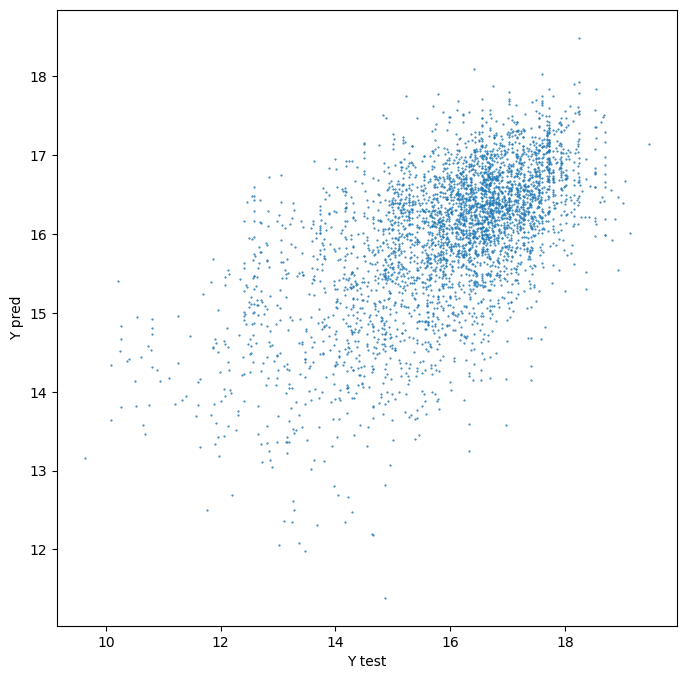

In [17]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.air_quality_index, pred, s=0.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

Plot results

In [22]:
from shapely.geometry import box

bds = data.total_bounds
extent = gpd.GeoSeries(
    [box((bds[0] - 7000), bds[1], bds[2] + 7000, bds[3])], crs=data.crs
).to_crs(3857)

Plot prediction using the same bins as real values.

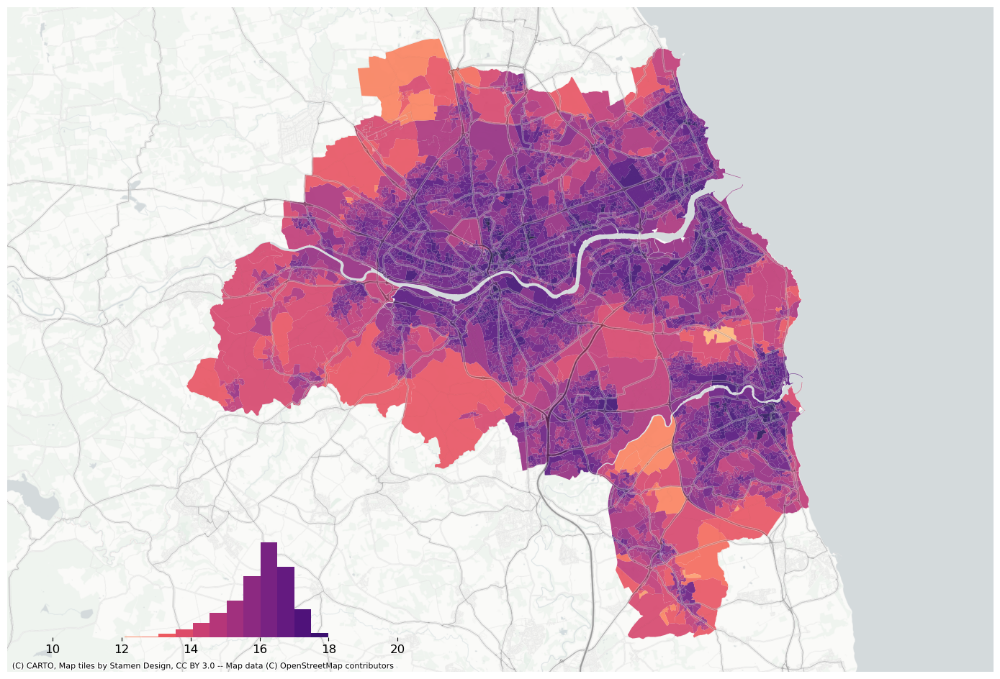

In [19]:
f, ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.EqualInterval(data["air_quality_index"].values, k=20).bins

data.assign(pred=pred).to_crs(3857).plot(
    "pred",
    scheme="userdefined",
    classification_kwds={"bins": bins},
    ax=ax,
    alpha=0.9,
    cmap="magma_r",
)
legendgram(
    f,
    ax,
    pred,
    bins,
    pal=palmpl.Magma_20_r,
    legend_size=(0.35, 0.15),  # legend size in fractions of the axis
    loc="lower left",  # matplotlib-style legend locations
    clip=(10, 20),  # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(
    ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution=""
)
contextily.add_basemap(
    ax=ax,
    source=contextily.providers.Stamen.TonerLines,
    alpha=0.4,
    attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors",
)
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")

Plot residuals

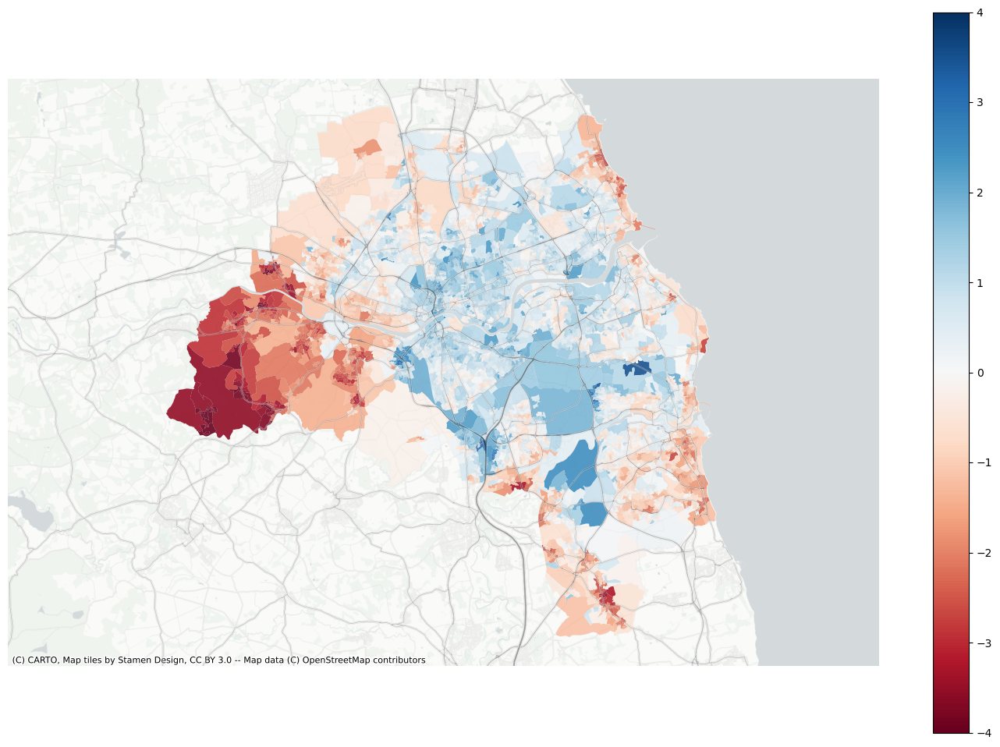

In [20]:
f, ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
data.assign(res=residuals).to_crs(3857).plot(
    "res", ax=ax, alpha=0.9, cmap="RdBu", vmin=-4, vmax=4, legend=True
)
ax.set_axis_off()
contextily.add_basemap(
    ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution=""
)
contextily.add_basemap(
    ax=ax,
    source=contextily.providers.Stamen.TonerLines,
    alpha=0.4,
    attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors",
)
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")

<AxesSubplot: ylabel='Frequency'>

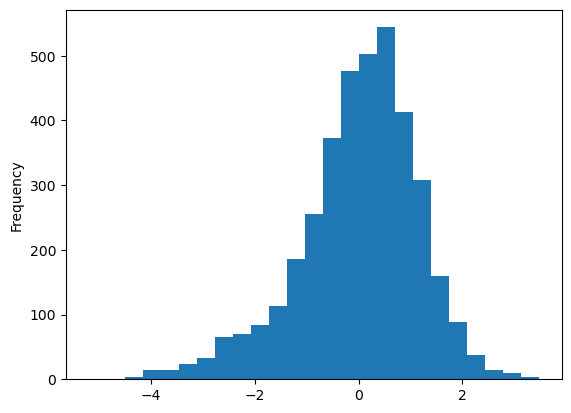

In [21]:
residuals.plot.hist(bins=25)

It seems that the baseline, while having generally decent performance, tends to overpredict periphery and slightly underpredict urban areas.

## Using spatial lag

We can add a lag into the mix. Let's start with the Queen weights.

In [6]:
queen = libpysal.weights.Queen.from_dataframe(data)
queen.transform = "R"

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)


In [23]:
for col in exvars.columns.copy():
    exvars[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(queen, exvars[col])

In [24]:
exvars.head()

,population_estimate,"A, B, D, E. Agriculture, energy and water",C. Manufacturing,F. Construction,"G, I. Distribution, hotels and restaurants","H, J. Transport and communication","K, L, M, N. Financial, real estate, professional and administrative activities","O,P,Q. Public administration, education and health","R, S, T, U. Other",Land cover [Discontinuous urban fabric],...,sdsAre_lag,sisBpM_lag,misCel_lag,ltcRea_lag,ldeAre_lag,lseCCo_lag,lseERI_lag,lteOri_lag,lteWNB_lag,lieWCe_lag
0,315,0.547024,3.146641,5.436732,4.839081,2.065436,4.283496,6.922660,1.606140,1.000000,...,30280.039796,0.064310,28.550796,51.060993,197839.799834,0.409687,0.881904,28.787310,0.014056,0.013885
1,415,0.028774,4.017802,3.870111,33.515266,8.821760,26.432214,83.050968,15.597812,0.152752,...,17776.067815,0.054231,13.316627,60.676470,32812.973123,0.398693,0.937619,20.853156,0.029603,0.001324
2,246,0.110388,1.325208,4.297030,11.481138,2.315769,4.408114,8.930658,3.636795,1.000000,...,54958.015580,0.058214,27.507441,53.117042,216595.359019,0.323117,0.784838,16.607145,0.009236,0.002879
3,277,0.478192,2.732637,4.713528,4.167451,1.776267,3.689214,5.194090,1.366452,0.931788,...,78050.340373,0.062603,29.854903,70.854692,351081.933889,0.398664,0.862998,23.747635,0.009530,0.013940
4,271,0.680069,3.917490,6.768659,6.029714,2.573226,5.335117,8.758326,2.003362,0.696472,...,27462.223773,0.067705,29.971743,52.001773,59309.608454,0.379304,0.890960,18.537922,0.016313,0.004461


In [25]:
regressor_lag = HistGradientBoostingRegressor(
    random_state=0,
)
est_lag = GridSearchCV(regressor_lag, parameters, verbose=1)

Fit the data.

In [26]:
%%time
est_lag.fit(exvars, data.air_quality_index)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
CPU times: user 11min 1s, sys: 12min 4s, total: 23min 5s
Wall time: 14min 16s


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.01, 0.05, 0.1, 0.2, 0.5, 1),
                         'max_bins': (64, 128, 255),
                         'max_iter': [100, 200, 500]},
             verbose=1)

In [27]:
est_lag.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_bins=64, max_iter=500,
                              random_state=0)

Test `HistGradientBoostingRegressor` without any pre-processing as a baseline.

In [28]:
est_lag.best_score_

0.5538384955550043

In [29]:
y_pred_lag = cross_val_predict(
    est_lag.best_estimator_, exvars, data.air_quality_index, cv=5
)

Get the prediction and residuals.

In [30]:
pred_lag = pd.Series(y_pred_lag, index=data.index)
residuals_lag = data.air_quality_index - pred_lag

Check the error

In [31]:
mean_squared_error(data.air_quality_index, pred_lag)

0.9191784959862161

MSE got down from 1.34 to 0.92, so there's a clear gain in including the lag.

Text(0, 0.5, 'Y pred')

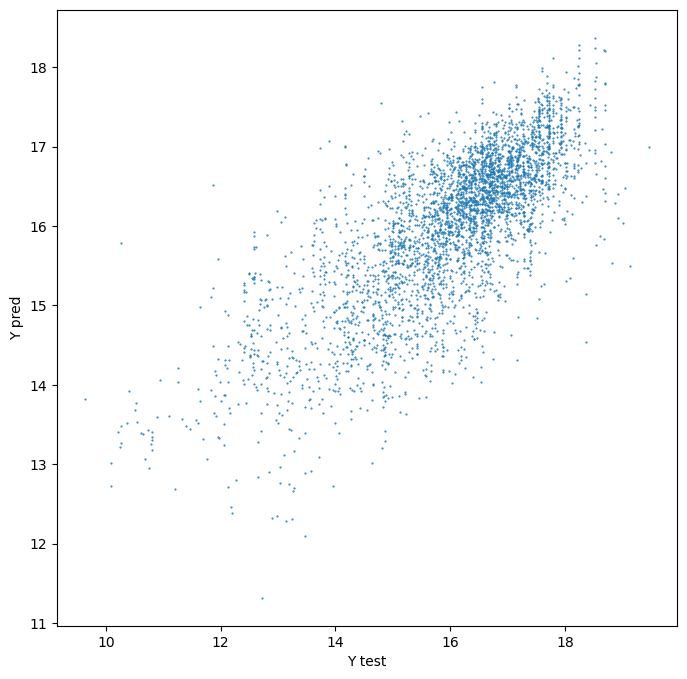

In [33]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.air_quality_index, pred_lag, s=0.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

Plot prediction using the same bins as real values.

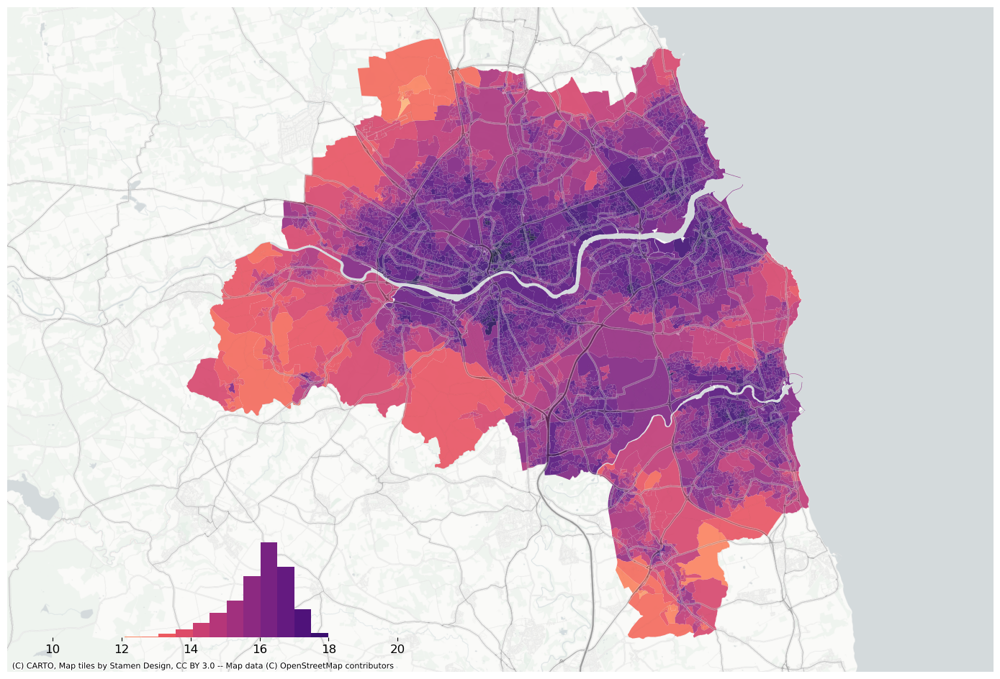

In [34]:
f, ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.EqualInterval(data["air_quality_index"].values, k=20).bins

data.assign(pred=pred_lag).to_crs(3857).plot(
    "pred",
    scheme="userdefined",
    classification_kwds={"bins": bins},
    ax=ax,
    alpha=0.9,
    cmap="magma_r",
)
legendgram(
    f,
    ax,
    pred,
    bins,
    pal=palmpl.Magma_20_r,
    legend_size=(0.35, 0.15),  # legend size in fractions of the axis
    loc="lower left",  # matplotlib-style legend locations
    clip=(10, 20),  # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(
    ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution=""
)
contextily.add_basemap(
    ax=ax,
    source=contextily.providers.Stamen.TonerLines,
    alpha=0.4,
    attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors",
)
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")

Plot residuals

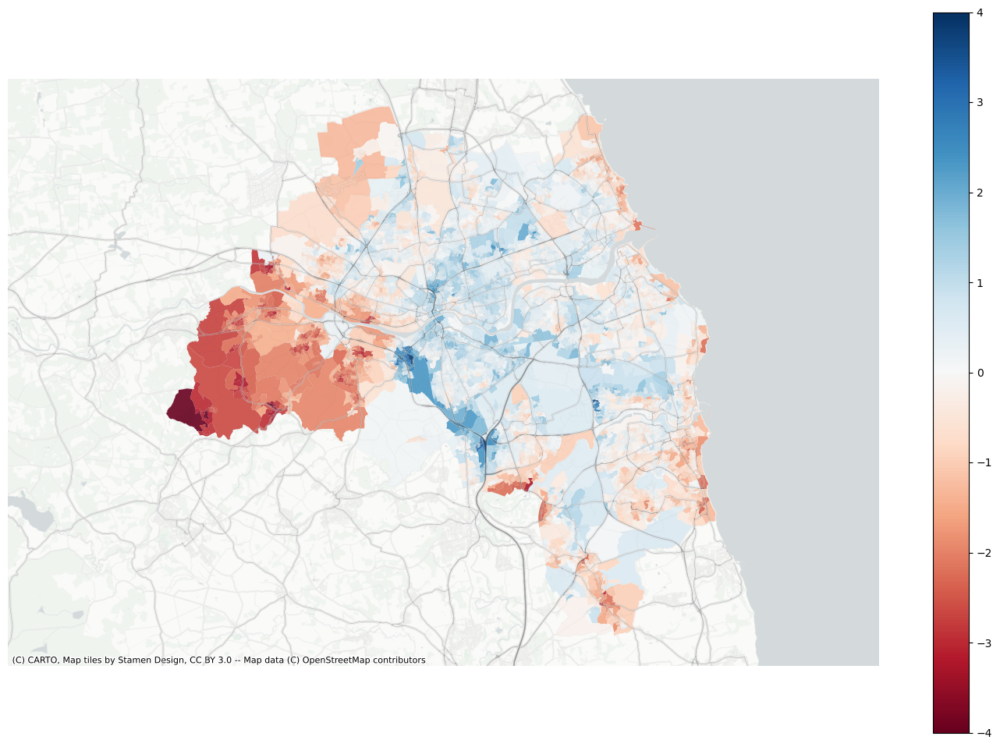

In [35]:
f, ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
data.assign(res=residuals_lag).to_crs(3857).plot(
    "res", ax=ax, alpha=0.9, cmap="RdBu", vmin=-4, vmax=4, legend=True
)
ax.set_axis_off()
contextily.add_basemap(
    ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution=""
)
contextily.add_basemap(
    ax=ax,
    source=contextily.providers.Stamen.TonerLines,
    alpha=0.4,
    attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors",
)
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")

The over and underprediction tendency still remains but the error is lower. 

The main underpredicted area is south of the city along the highway - I belive that is due to relatively open OAs and no information on the highway in the explanatory variables. 

The main overprediction happens in the green belt - there's very few of these low values so the K-fold modelling exercise likely does not have enough low-value observations to learn it.

<AxesSubplot: ylabel='Frequency'>

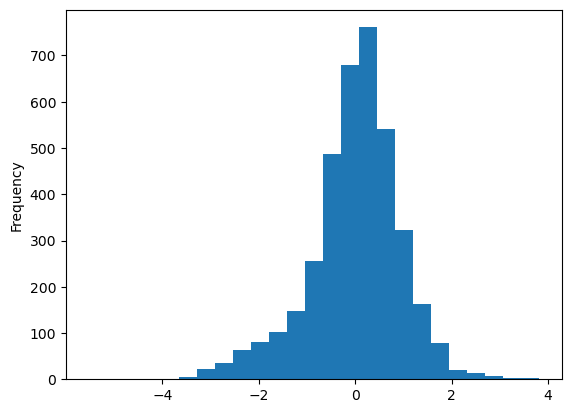

In [36]:
residuals_lag.plot.hist(bins=25)

Overlay of original and a lagged model. We can see that the lagged one is more precise also here.

<AxesSubplot: ylabel='Frequency'>

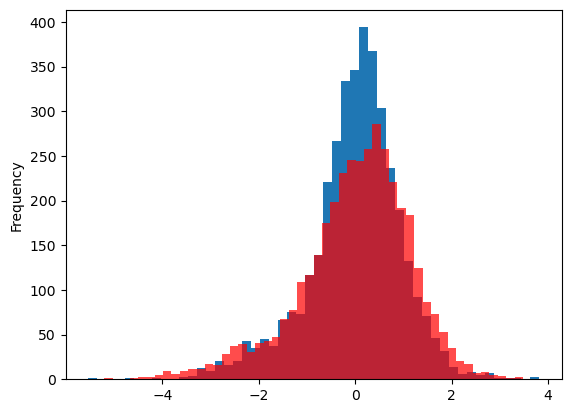

In [38]:
ax = residuals_lag.plot.hist(bins=50)
residuals.plot.hist(bins=50, ax=ax, color="r", alpha=0.7)

The average residuals:

In [40]:
residuals_lag.abs().mean(), residuals.abs().mean()

(0.7127002931466176, 0.8861835077899286)

Interestingly enough, both options have the same parameters of the best model.

In [42]:
est_lag.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_bins=64, max_iter=500,
                              random_state=0)

In [43]:
est.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_bins=64, max_iter=500,
                              random_state=0)

### Wider weights

In [8]:
queen = libpysal.weights.Queen.from_dataframe(data)
queen3 = libpysal.weights.higher_order(queen, k=3, lower_order=True)

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)


In [10]:
queen3.transform = "R"

In [11]:
for col in exvars.columns.copy():
    exvars[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(queen3, exvars[col])

In [24]:
exvars.head()

,population_estimate,"A, B, D, E. Agriculture, energy and water",C. Manufacturing,F. Construction,"G, I. Distribution, hotels and restaurants","H, J. Transport and communication","K, L, M, N. Financial, real estate, professional and administrative activities","O,P,Q. Public administration, education and health","R, S, T, U. Other",Land cover [Discontinuous urban fabric],...,sdsAre_lag,sisBpM_lag,misCel_lag,ltcRea_lag,ldeAre_lag,lseCCo_lag,lseERI_lag,lteOri_lag,lteWNB_lag,lieWCe_lag
0,315,0.547024,3.146641,5.436732,4.839081,2.065436,4.283496,6.922660,1.606140,1.000000,...,30280.039796,0.064310,28.550796,51.060993,197839.799834,0.409687,0.881904,28.787310,0.014056,0.013885
1,415,0.028774,4.017802,3.870111,33.515266,8.821760,26.432214,83.050968,15.597812,0.152752,...,17776.067815,0.054231,13.316627,60.676470,32812.973123,0.398693,0.937619,20.853156,0.029603,0.001324
2,246,0.110388,1.325208,4.297030,11.481138,2.315769,4.408114,8.930658,3.636795,1.000000,...,54958.015580,0.058214,27.507441,53.117042,216595.359019,0.323117,0.784838,16.607145,0.009236,0.002879
3,277,0.478192,2.732637,4.713528,4.167451,1.776267,3.689214,5.194090,1.366452,0.931788,...,78050.340373,0.062603,29.854903,70.854692,351081.933889,0.398664,0.862998,23.747635,0.009530,0.013940
4,271,0.680069,3.917490,6.768659,6.029714,2.573226,5.335117,8.758326,2.003362,0.696472,...,27462.223773,0.067705,29.971743,52.001773,59309.608454,0.379304,0.890960,18.537922,0.016313,0.004461


In [12]:
regressor_lag = HistGradientBoostingRegressor(
    random_state=0,
)
est_lag = GridSearchCV(regressor_lag, parameters, verbose=1)

Fit the data.

In [13]:
%%time
est_lag.fit(exvars, data.air_quality_index)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
CPU times: user 10min 48s, sys: 11min 32s, total: 22min 21s
Wall time: 13min 59s


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.01, 0.05, 0.1, 0.2, 0.5, 1),
                         'max_bins': (64, 128, 255),
                         'max_iter': [100, 200, 500]},
             verbose=1)

In [14]:
est_lag.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_bins=128, max_iter=500,
                              random_state=0)

Test `HistGradientBoostingRegressor` without any pre-processing as a baseline.

In [15]:
est_lag.best_score_

0.76202775278368

In [16]:
y_pred_lag = cross_val_predict(
    est_lag.best_estimator_, exvars, data.air_quality_index, cv=5
)

Get the prediction and residuals.

In [17]:
pred_lag = pd.Series(y_pred_lag, index=data.index)
residuals_lag = data.air_quality_index - pred_lag

Check the error

In [18]:
mean_squared_error(data.air_quality_index, pred_lag)

0.5447792769804048

In [19]:
residuals_lag.abs().mean()

0.51491983590584

Text(0, 0.5, 'Y pred')

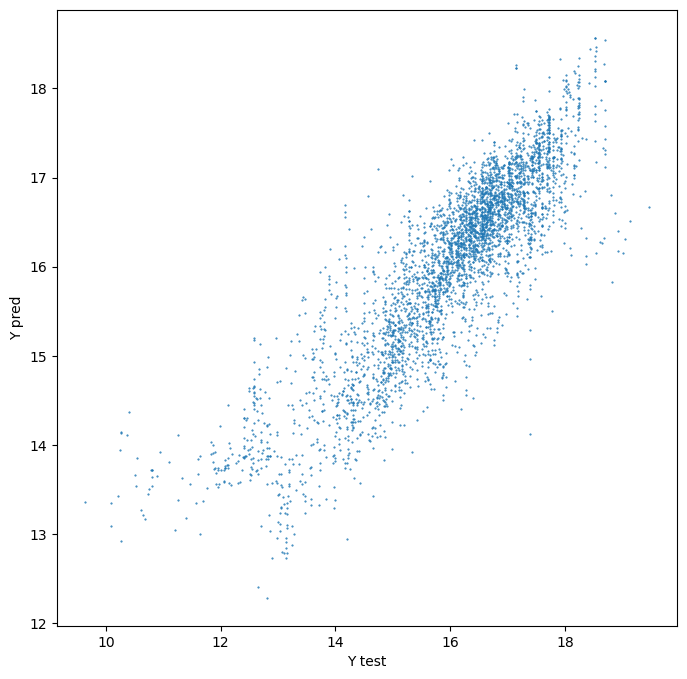

In [20]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.air_quality_index, pred_lag, s=0.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

Plot prediction using the same bins as real values.

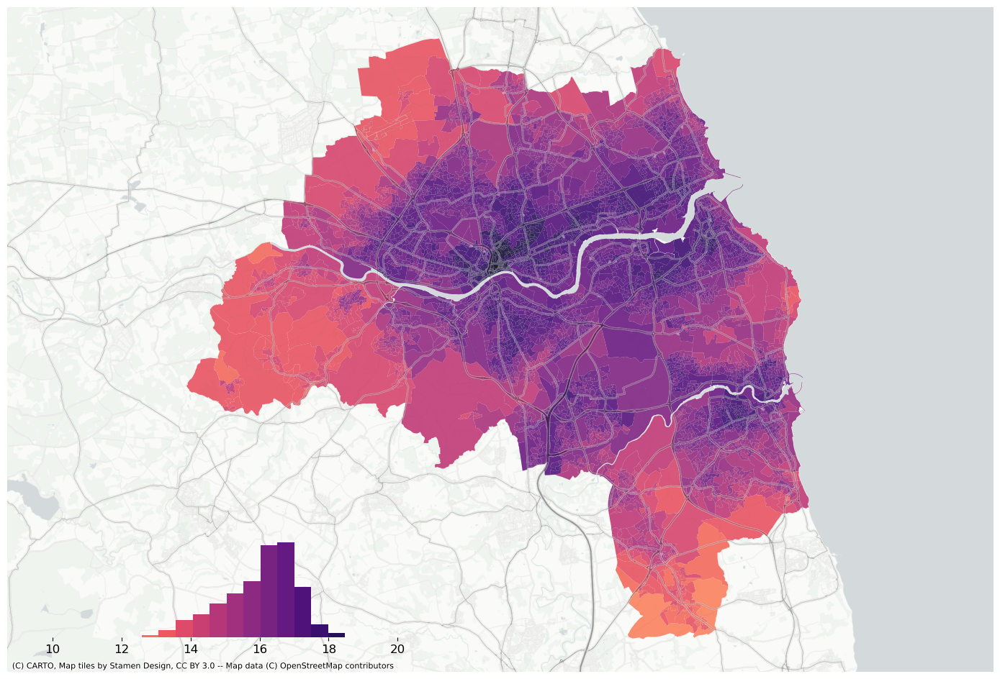

In [24]:
f, ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.EqualInterval(data["air_quality_index"].values, k=20).bins

data.assign(pred=pred_lag).to_crs(3857).plot(
    "pred",
    scheme="userdefined",
    classification_kwds={"bins": bins},
    ax=ax,
    alpha=0.9,
    cmap="magma_r",
)
legendgram(
    f,
    ax,
    pred_lag,
    bins,
    pal=palmpl.Magma_20_r,
    legend_size=(0.35, 0.15),  # legend size in fractions of the axis
    loc="lower left",  # matplotlib-style legend locations
    clip=(10, 20),  # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(
    ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution=""
)
contextily.add_basemap(
    ax=ax,
    source=contextily.providers.Stamen.TonerLines,
    alpha=0.4,
    attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors",
)
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")

Plot residuals

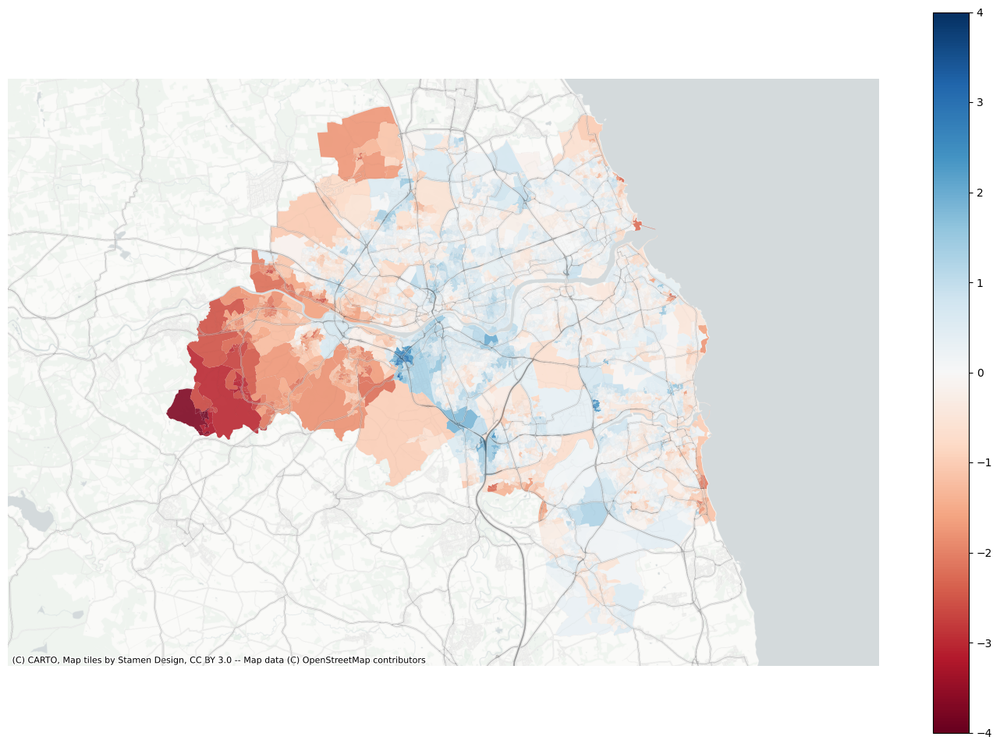

In [25]:
f, ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
data.assign(res=residuals_lag).to_crs(3857).plot(
    "res", ax=ax, alpha=0.9, cmap="RdBu", vmin=-4, vmax=4, legend=True
)
ax.set_axis_off()
contextily.add_basemap(
    ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution=""
)
contextily.add_basemap(
    ax=ax,
    source=contextily.providers.Stamen.TonerLines,
    alpha=0.4,
    attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors",
)
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")

<AxesSubplot: ylabel='Frequency'>

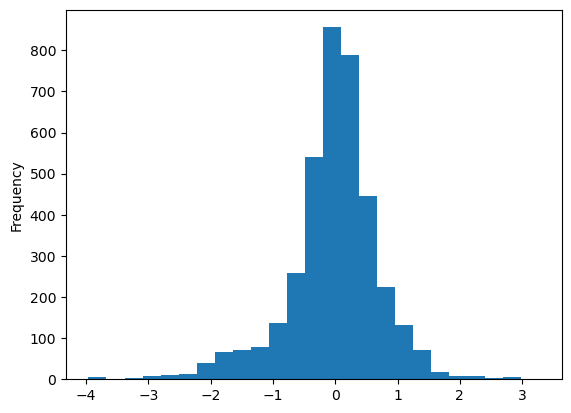

In [26]:
residuals_lag.plot.hist(bins=25)

## With latent representation of Sentinel 2

Try including the lagged latent representation from the postcode Sentinel paper.

In [12]:
latent_oa = pd.read_parquet(f"{data_folder}/processed/sentinel/latent_oa.parquet")

In [14]:
queen = libpysal.weights.Queen.from_dataframe(data)
queen.transform = "R"

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)


In [17]:
exvars_latent = pd.concat([exvars, latent_oa.drop(columns="geometry")], axis=1)

In [18]:
for col in exvars_latent.columns.copy():
    exvars_latent[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
        queen, exvars_latent[col]
    )

/var/folders/2f/fhks6w_d0k556plcv3rfmshw0000gn/T/ipykernel_54819/186550642.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  exvars_latent[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
/var/folders/2f/fhks6w_d0k556plcv3rfmshw0000gn/T/ipykernel_54819/186550642.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  exvars_latent[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
/var/folders/2f/fhks6w_d0k556plcv3rfmshw0000gn/T/ipykernel_54819/186550642.py:2: PerformanceWarning: DataFrame is highly fragmented.  Th

In [20]:
exvars_latent = exvars_latent.copy()

In [22]:
parameters = {
    "learning_rate": (0.01, 0.05, 0.1),
    "max_iter": [500],
    "max_bins": (64, 128),
}

Initiate GridSearchCV with Histogram-based Gradient Boosting Regression Tree.

In [25]:
regressor = HistGradientBoostingRegressor(
    random_state=0,
)
est_latent = GridSearchCV(regressor, parameters, verbose=1)

Fit the data.

In [26]:
%%time
est_latent.fit(exvars_latent, data.air_quality_index)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
CPU times: user 3min 14s, sys: 2min 35s, total: 5min 49s
Wall time: 3min 26s


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.01, 0.05, 0.1),
                         'max_bins': (64, 128), 'max_iter': [500]},
             verbose=1)

In [27]:
est_latent.best_estimator_

HistGradientBoostingRegressor(max_bins=128, max_iter=500, random_state=0)

Test `HistGradientBoostingRegressor` without any pre-processing as a baseline.

In [28]:
est_latent.best_score_

0.6205192288572696

In [29]:
y_pred_latent = cross_val_predict(
    est_latent.best_estimator_, exvars_latent, data.air_quality_index, cv=5
)

Get the prediction and residuals.

In [31]:
pred_latent = pd.Series(y_pred_latent, index=data.index)
residuals_latent = data.air_quality_index - pred_latent

Check the error

In [32]:
mean_squared_error(data.air_quality_index, pred_latent)

0.8272652037619179

MSE got down from 1.34 to 0.92, so there's a clear gain in including the lag.

Text(0, 0.5, 'Y pred')

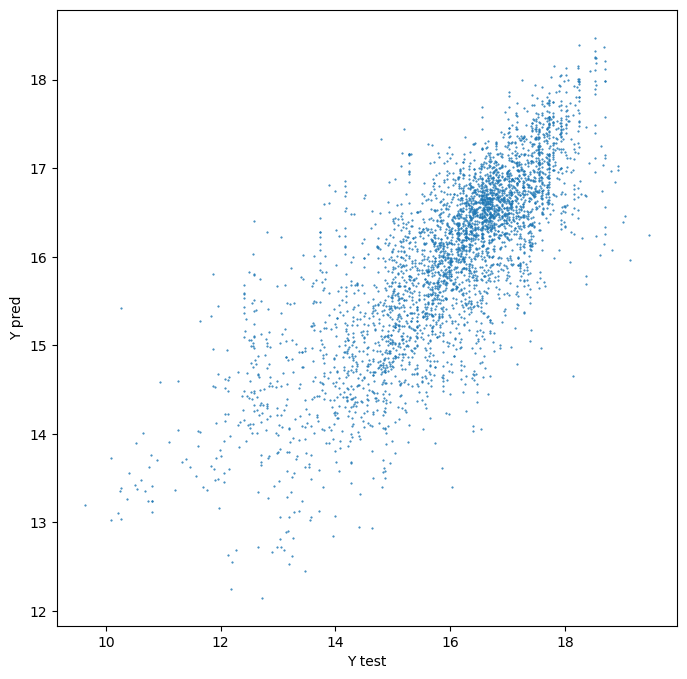

In [33]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.air_quality_index, pred_latent, s=0.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

Plot prediction using the same bins as real values.

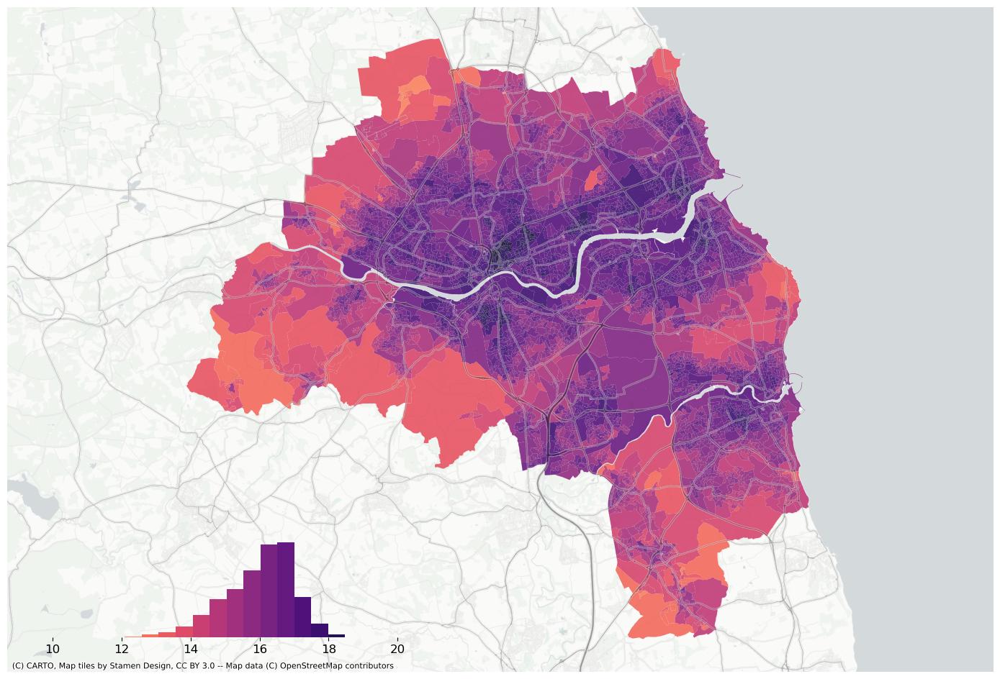

In [36]:
f, ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.EqualInterval(data["air_quality_index"].values, k=20).bins

data.assign(pred=pred_latent).to_crs(3857).plot(
    "pred",
    scheme="userdefined",
    classification_kwds={"bins": bins},
    ax=ax,
    alpha=0.9,
    cmap="magma_r",
)
legendgram(
    f,
    ax,
    pred_latent,
    bins,
    pal=palmpl.Magma_20_r,
    legend_size=(0.35, 0.15),  # legend size in fractions of the axis
    loc="lower left",  # matplotlib-style legend locations
    clip=(10, 20),  # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(
    ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution=""
)
contextily.add_basemap(
    ax=ax,
    source=contextily.providers.Stamen.TonerLines,
    alpha=0.4,
    attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors",
)
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")

Plot residuals

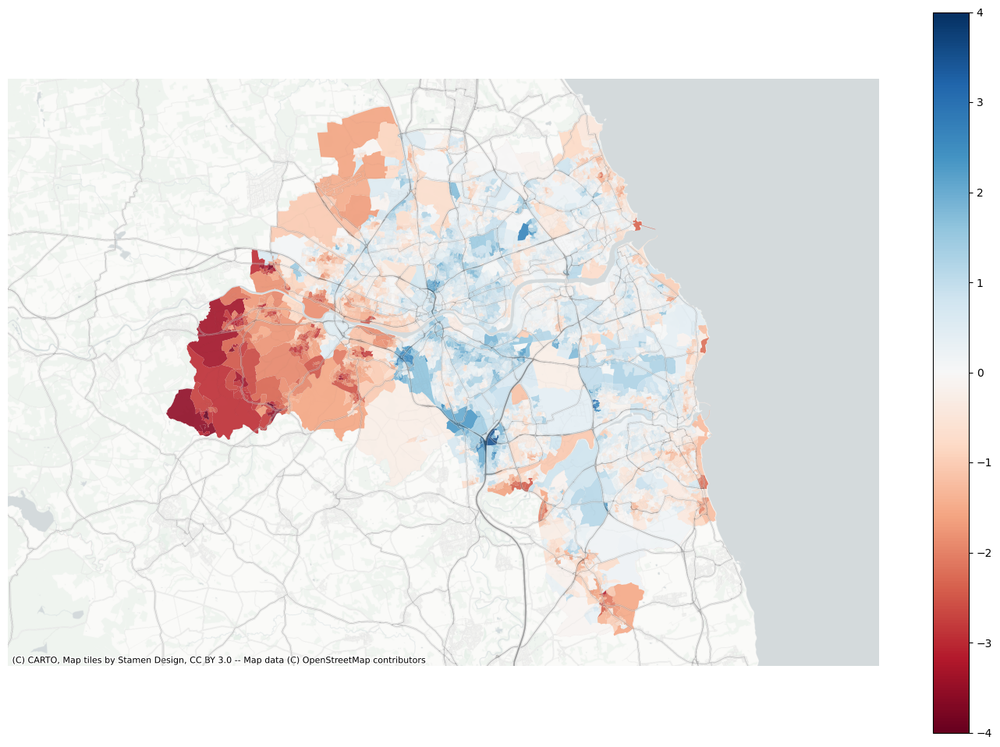

In [37]:
f, ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
data.assign(res=residuals_latent).to_crs(3857).plot(
    "res", ax=ax, alpha=0.9, cmap="RdBu", vmin=-4, vmax=4, legend=True
)
ax.set_axis_off()
contextily.add_basemap(
    ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution=""
)
contextily.add_basemap(
    ax=ax,
    source=contextily.providers.Stamen.TonerLines,
    alpha=0.4,
    attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors",
)
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")

<AxesSubplot: ylabel='Frequency'>

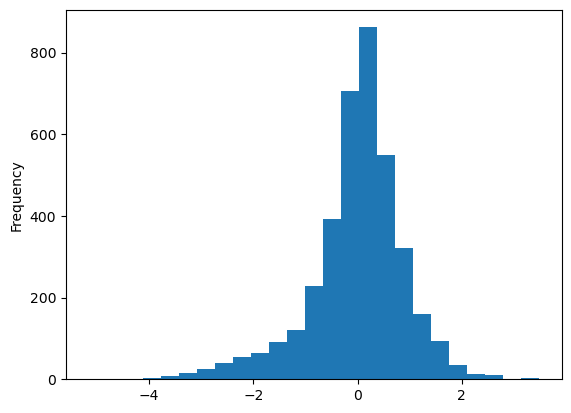

In [38]:
residuals_latent.plot.hist(bins=25)

### Only Sentinel2

In [40]:
regressor = HistGradientBoostingRegressor(
    random_state=0,
)
est_s2 = GridSearchCV(regressor, parameters, verbose=1)

In [41]:
%%time
est_s2.fit(latent_oa.drop(columns="geometry"), data.air_quality_index)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
CPU times: user 1min 32s, sys: 2min 19s, total: 3min 52s
Wall time: 2min 36s


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.01, 0.05, 0.1),
                         'max_bins': (64, 128), 'max_iter': [500]},
             verbose=1)

In [42]:
est_s2.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_bins=64, max_iter=500,
                              random_state=0)

Test `HistGradientBoostingRegressor` without any pre-processing as a baseline.

In [43]:
est_s2.best_score_

0.23497429291310237

In [45]:
y_pred_s2 = cross_val_predict(
    est_s2.best_estimator_,
    latent_oa.drop(columns="geometry"),
    data.air_quality_index,
    cv=5,
)

Get the prediction and residuals.

In [46]:
pred_s2 = pd.Series(y_pred_s2, index=data.index)
residuals_s2 = data.air_quality_index - pred_s2

Check the error

In [47]:
mean_squared_error(data.air_quality_index, pred_s2)

1.570113449347073

MSE got down from 1.34 to 0.92, so there's a clear gain in including the lag.

Text(0, 0.5, 'Y pred')

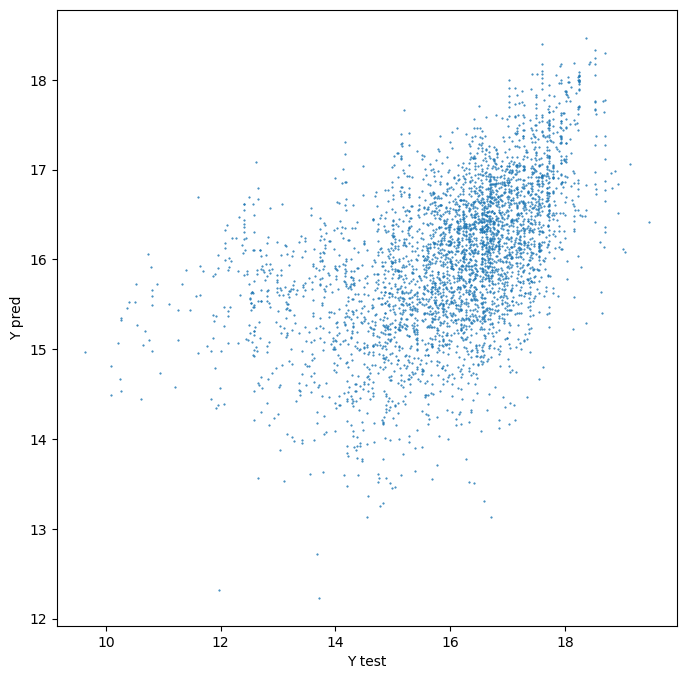

In [48]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.air_quality_index, pred_s2, s=0.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

Plot prediction using the same bins as real values.

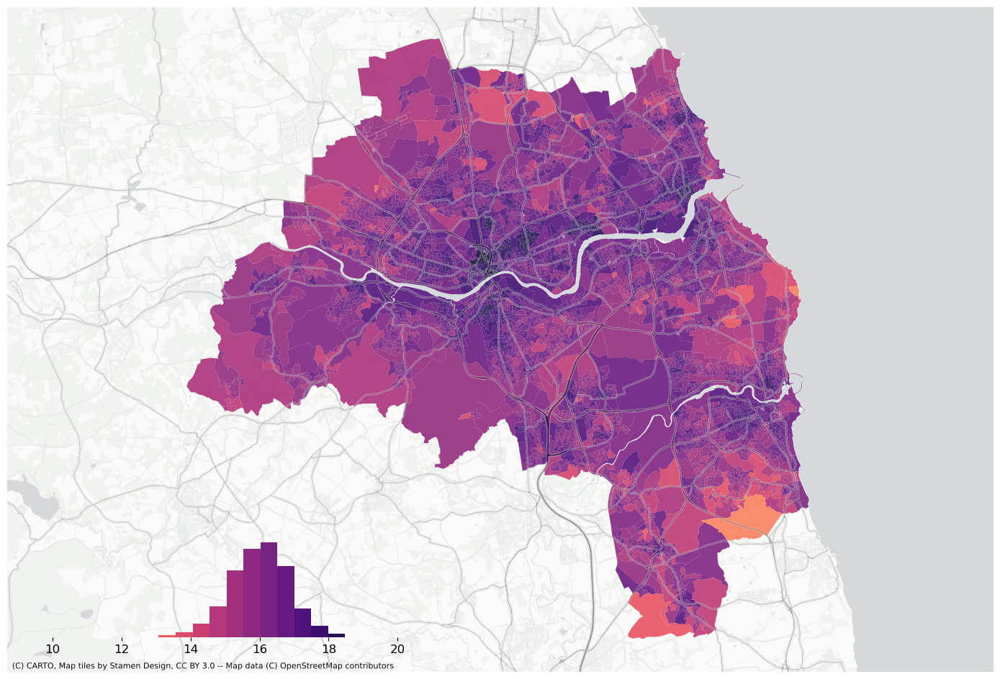

In [49]:
f, ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.EqualInterval(data["air_quality_index"].values, k=20).bins

data.assign(pred=pred_s2).to_crs(3857).plot(
    "pred",
    scheme="userdefined",
    classification_kwds={"bins": bins},
    ax=ax,
    alpha=0.9,
    cmap="magma_r",
)
legendgram(
    f,
    ax,
    pred_s2,
    bins,
    pal=palmpl.Magma_20_r,
    legend_size=(0.35, 0.15),  # legend size in fractions of the axis
    loc="lower left",  # matplotlib-style legend locations
    clip=(10, 20),  # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(
    ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution=""
)
contextily.add_basemap(
    ax=ax,
    source=contextily.providers.Stamen.TonerLines,
    alpha=0.4,
    attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors",
)
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")

Plot residuals

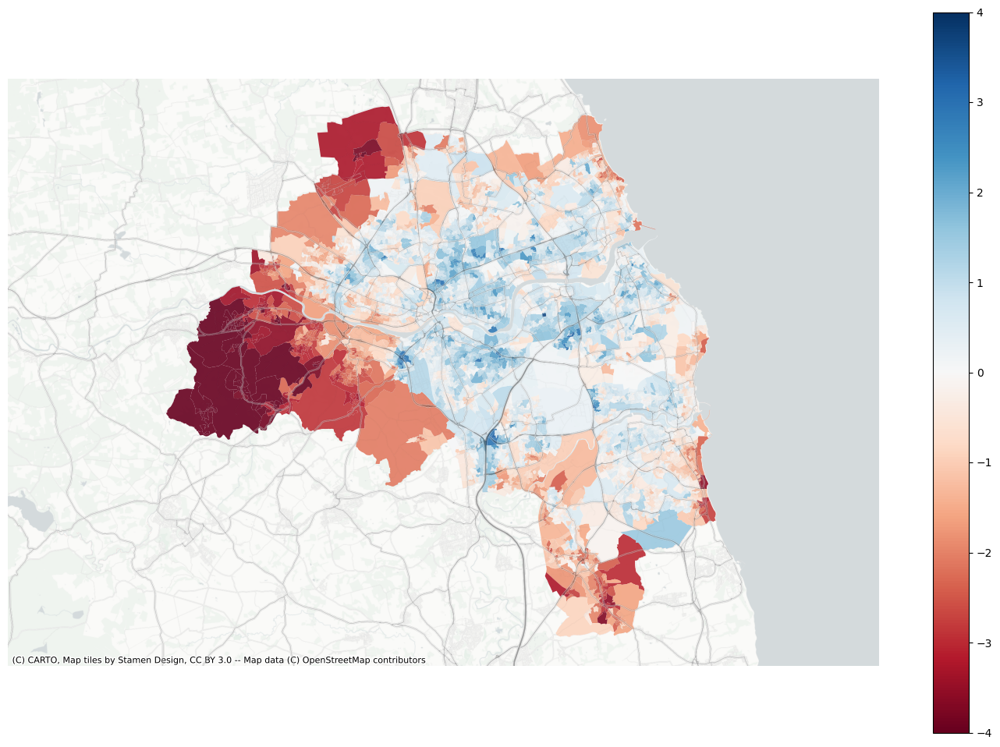

In [50]:
f, ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
data.assign(res=residuals_s2).to_crs(3857).plot(
    "res", ax=ax, alpha=0.9, cmap="RdBu", vmin=-4, vmax=4, legend=True
)
ax.set_axis_off()
contextily.add_basemap(
    ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution=""
)
contextily.add_basemap(
    ax=ax,
    source=contextily.providers.Stamen.TonerLines,
    alpha=0.4,
    attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors",
)
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")